In [52]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [53]:
# Data Collection
DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

df = pd.read_csv(DATA_URL+"telecom_churn.csv")

In [54]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [55]:
df.shape

(3333, 20)

## Data Visualization

### 1. Quantitative Features
(Numerical Features)

#### Histograms and density plots

array([[<Axes: title={'center': 'Total day minutes'}>,
        <Axes: title={'center': 'Total intl calls'}>]], dtype=object)

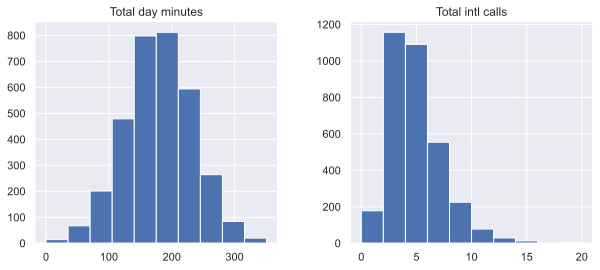

In [56]:
features = ["Total day minutes", "Total intl calls"]
df[features].hist(figsize=(10,4))

**Density plot or Kernel Density plots**</br>
Also Known as smooth version of Histogram. Main advantage over histogram is that they do not depends on the size of bin.

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

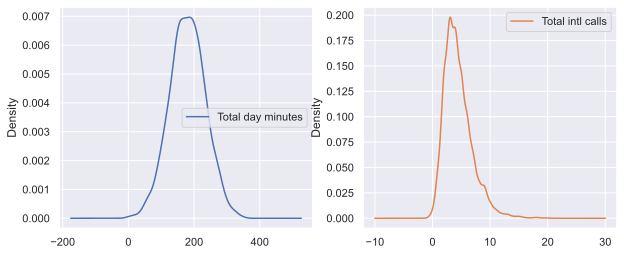

In [57]:
df[features].plot(
kind = "density", subplots = True, layout=(1, 2), sharex= False,
figsize = (10,4))

**distplot()**</br>
displays the histogram withe Kernal Desity estimate(KDE) on top

C:\Users\subit\AppData\Local\Temp\ipykernel_26056\2818465734.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df["Total intl calls"])


<Axes: xlabel='Total intl calls', ylabel='Density'>

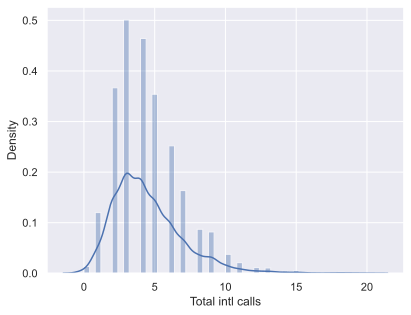

In [58]:
sns.distplot(df["Total intl calls"])

#### Box Plot

<Axes: xlabel='Total intl calls'>

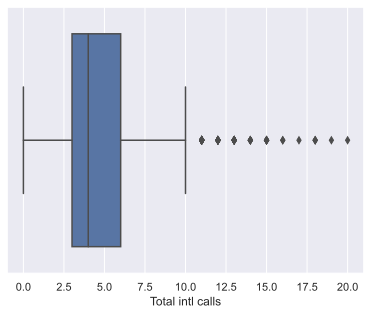

In [59]:
sns.boxplot(x = "Total intl calls", data = df)

#### Violin Plot

<Axes: >

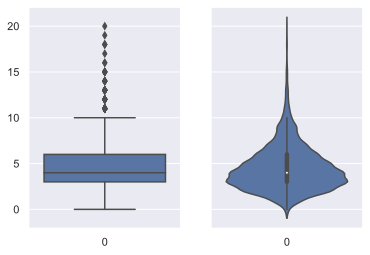

In [60]:
_,axes = plt.subplots(1,2, sharey = True, figsize = (6,4))
sns.boxplot(data = df["Total intl calls"], ax = axes[0])
sns.violinplot(data=df["Total intl calls"], ax = axes[1])

The difference between the box and violin plots is that the former illustrates certain statistics concerning individual examples in a dataset while the violin plot concentrates more on the smoothed distribution as a whole.

### 2. Categorical and Binary features

#### Frequency table

In [61]:
df["Churn"].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

#### Bar Plot

<Axes: xlabel='Customer service calls', ylabel='count'>

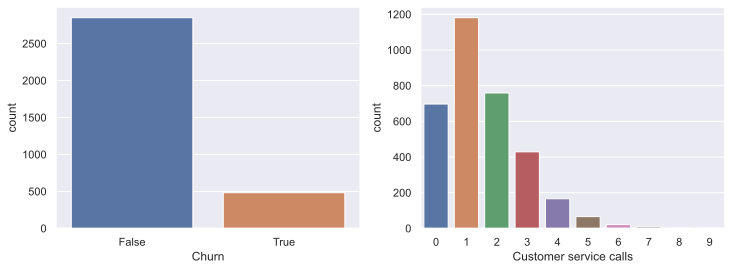

In [62]:
_, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12,4))
sns.countplot(x="Churn", data = df, ax = axes[0])
sns.countplot(x="Customer service calls", data = df, ax = axes[1])

### 3. Multivariate Visualization

**Quatitative vs Quantitative features**

<Axes: >

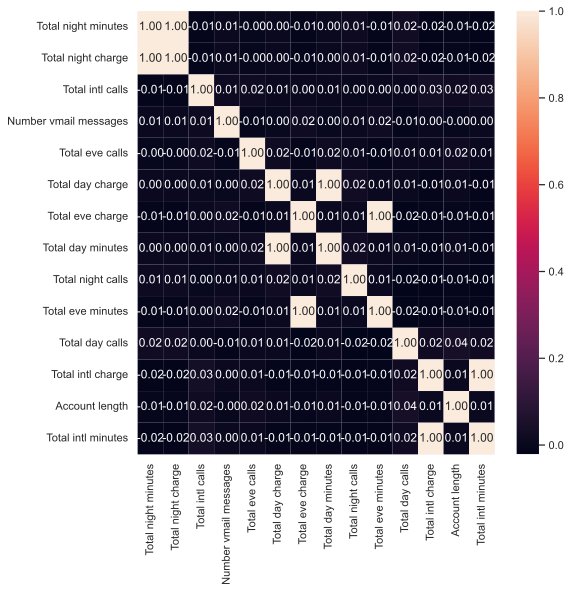

In [63]:
# create a correlation matrix and make a heatmap using the same

numerical_col = list(set(df.columns)-
                     set(["State",
                         "International plan",
                         "Voice mail plan",
                         "Area code",
                         "Churn",
                         "Customer service calls"]))

# Correlation matrix
corr_matrix = df[numerical_col].corr()
_,ax = plt.subplots(figsize = (8,8))
sns.heatmap(corr_matrix, annot = True, fmt = ".2f", ax =ax)

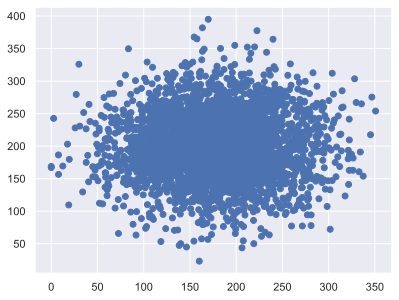

In [64]:
# Scatter plot

plt.scatter(df["Total day minutes"], df["Total night minutes"])

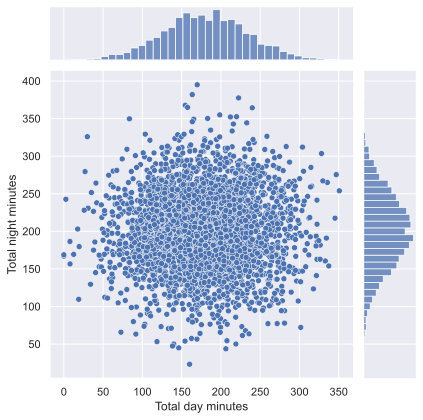

In [65]:
# jointplot
sns.jointplot(x = "Total day minutes", y = "Total night minutes",
              data = df, kind = "scatter")

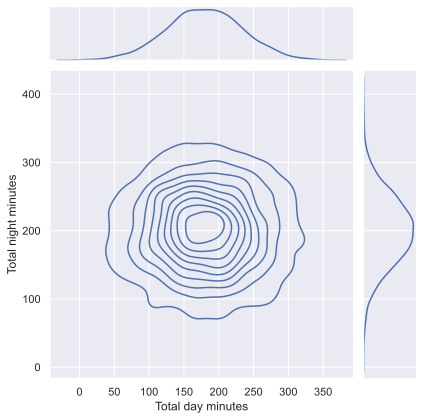

In [66]:
# jointplot smooth version
sns.jointplot(x = "Total day minutes", y = "Total night minutes",
              data = df, kind = "kde")

C:\Users\subit\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


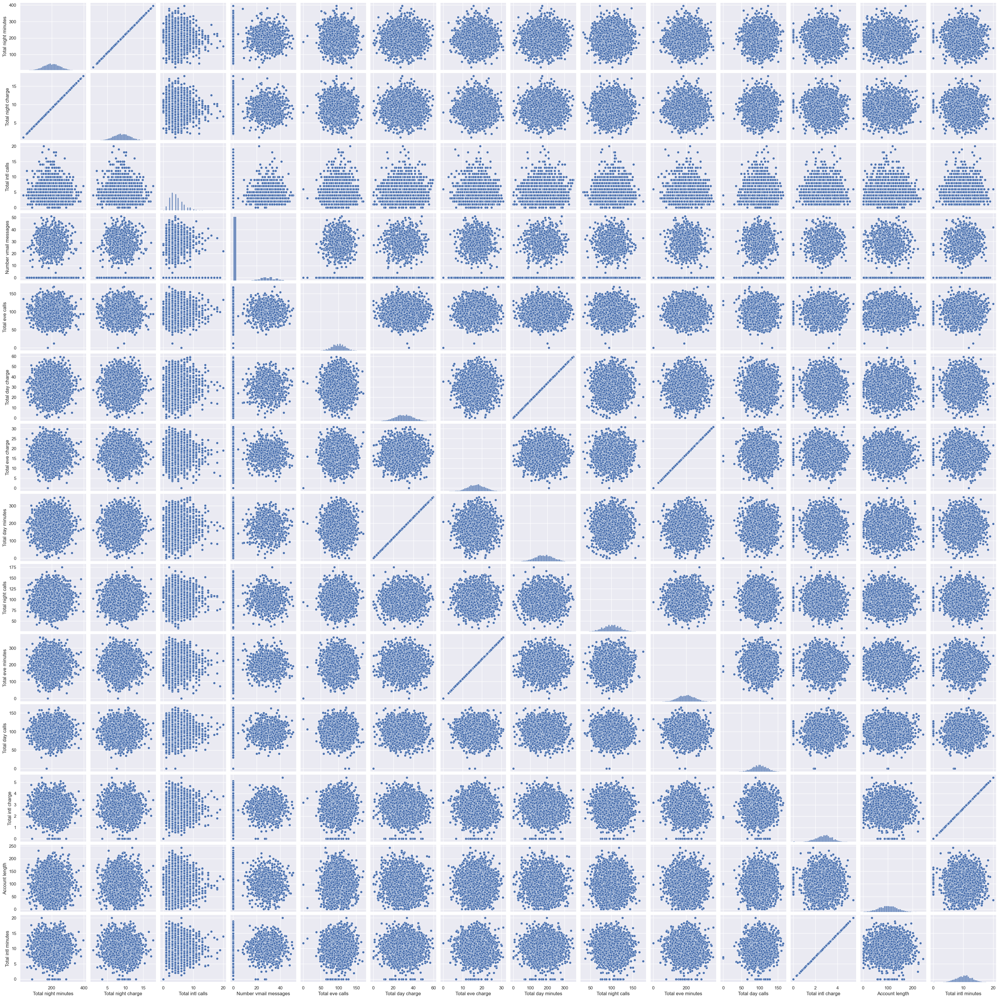

In [40]:
# Scatter Plot
# set the format to 'png' as 'svg' might take time
%config InlineBackend.figure_format = "png"
sns.pairplot(df[numerical_col])

In [41]:
# set the formatting back to "svg"
%config InlineBackend.figure_format = "svg"

#### Quantitative vs. Categorical

C:\Users\subit\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


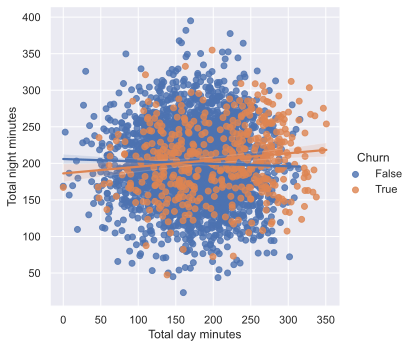

In [67]:
# lmplot
sns.lmplot(x = "Total day minutes",
          y = "Total night minutes",
          data = df,
          hue = "Churn",
          fit_reg = "False")

In [ ]:
numerical_col.append("Customer service calls")

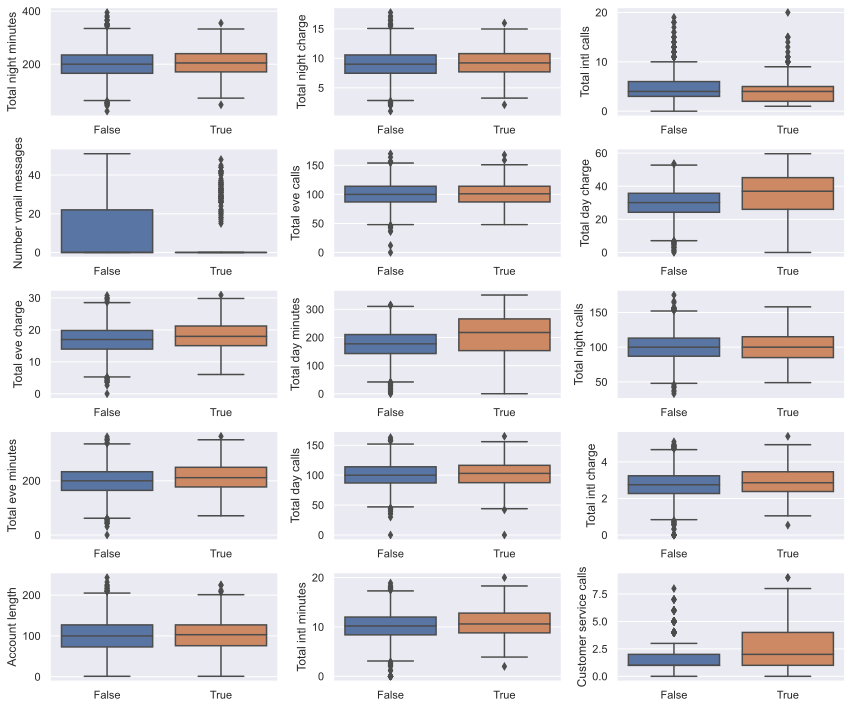

In [79]:
# Box plot

fig, axes = plt.subplots(nrows = 5, ncols = 3, figsize = (12, 10))
for idx, feat in enumerate(numerical_col):
    ax = axes[int(idx/3), idx%3]
    sns.boxplot(x = "Churn", y = feat, data=df, ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel(feat)
fig.tight_layout()

<Axes: xlabel='Churn', ylabel='Total day minutes'>

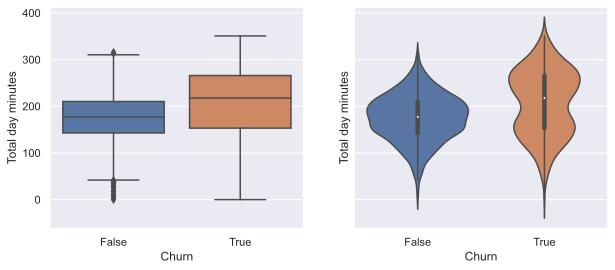

In [80]:
_,axes = plt.subplots(1,2, sharey= True, figsize= (10,4))

sns.boxplot(x="Churn", y = "Total day minutes", data = df, ax = axes[0])
sns.violinplot(x="Churn", y = "Total day minutes", data = df, ax = axes[1])

C:\Users\subit\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


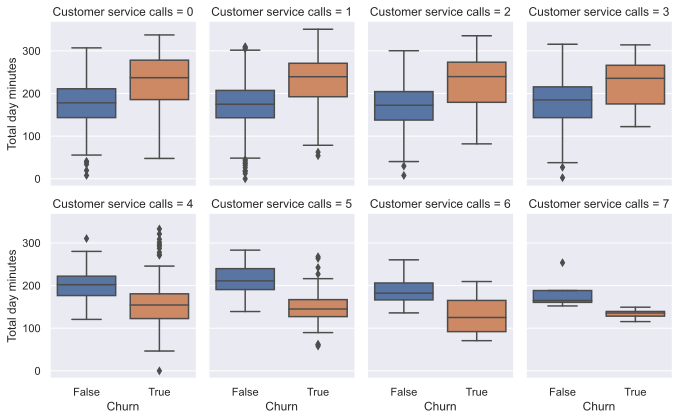

In [81]:
# catplot()

sns.catplot(
x = "Churn",
y = "Total day minutes",
col = "Customer service calls",
data = df[df["Customer service calls"]<8],
kind = "box",
col_wrap = 4,
height = 3,
aspect = 0.8)

#### Categorical vs cateorical

<Axes: xlabel='Customer service calls', ylabel='count'>

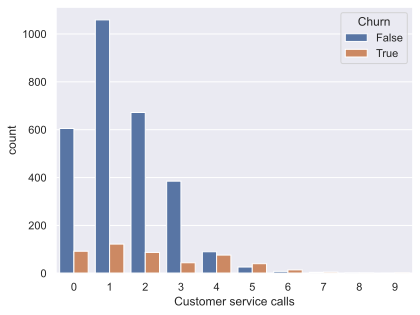

In [82]:
sns.countplot(x="Customer service calls", hue = "Churn", data = df)

<Axes: xlabel='Voice mail plan', ylabel='count'>

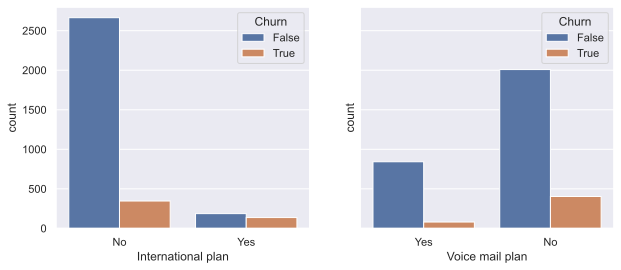

In [83]:
_, axes = plt.subplots(1,2, sharey = True, figsize = (10,4))

sns.countplot(x="International plan", hue= "Churn", data=df, ax=axes[0])
sns.countplot(x="Voice mail plan", hue= "Churn", data=df, ax=axes[1])

### Contigency table
Cross Tabulation or crosstab

In [86]:
pd.crosstab(df["State"],df["Churn"])

Churn,False,True
State,,
AK,49,3
AL,72,8
AR,44,11
AZ,60,4
CA,25,9
CO,57,9
CT,62,12
DC,49,5
DE,52,9


In [89]:
df.groupby(["State"])["Churn"].agg([np.mean]).sort_values(by="mean", ascending=False)

,mean
State,
NJ,0.264706
CA,0.264706
TX,0.250000
MD,0.242857
SC,0.233333
MI,0.219178
MS,0.215385
NV,0.212121
WA,0.212121


### t-SNE
t-distributed Stochastic Neighbor Embedding. Its basic idea is simple: find a projection for a high-dimensional feature space onto a plane (or a 3D hyperplane, but it is almost always 2D) such that those points that were far apart in the initial n-dimensional space will end up far apart on the plane. Those that were originally close would remain close to each other.

Essentially, neighbor embedding is a search for a new and less-dimensional data representation that preserves neighborship of examples.

In [90]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [91]:
X = df.drop(["Churn", "State"], axis = 1)
X["International plan"] = X["International plan"].map({"Yes": 1, "No":0})
X["Voice mail plan"] = X["Voice mail plan"].map({"Yes": 1, "No":0})

In [92]:
# Normalize the dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [94]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

CPU times: total: 1min 5s
Wall time: 1min 2s


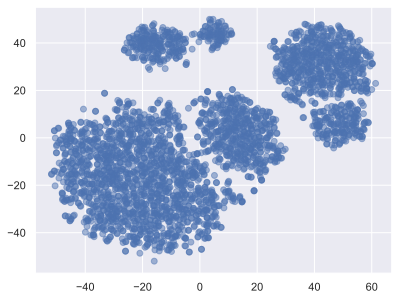

In [95]:
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5);

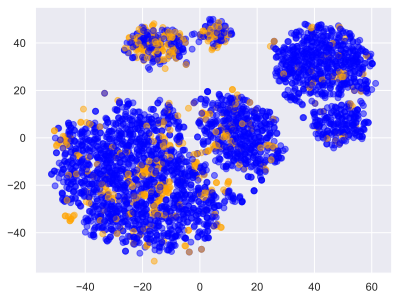

In [96]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=df["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

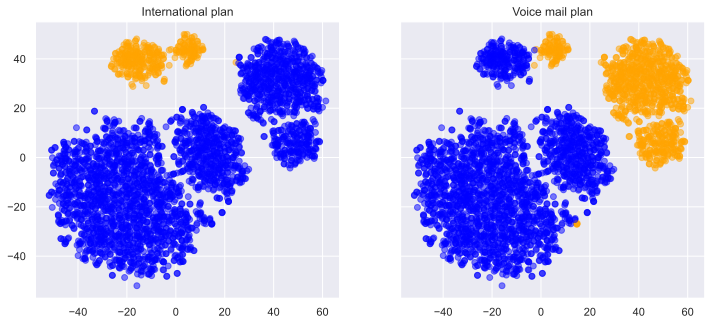

In [97]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=df[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);